## Import Libs

In [8]:
import numpy as np
import pandas as pd
import os
import tarfile
import urllib
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import  ProfileReport
%matplotlib inline

## Read the Data

In [2]:
df = pd.read_csv('train.csv')

## Start exploring the data

In [3]:
df.head()

,Id,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
0,1,Marina Maximilian,Not Afraid,37.0,0.334,0.536,9.0,-6.649,0,0.0381,0.378000,NaN,0.106,0.235,152.429,204947.0,4,9
1,2,The Black Keys,Howlin' for You,67.0,0.725,0.747,11.0,-5.545,1,0.0876,0.027200,0.0468,0.104,0.380,132.921,191956.0,4,6
2,3,Royal & the Serpent,phuck u,NaN,0.584,0.804,7.0,-6.094,1,0.0619,0.000968,0.6350,0.284,0.635,159.953,161037.0,4,10
3,4,Detroit Blues Band,Missing You,12.0,0.515,0.308,NaN,-14.711,1,0.0312,0.907000,0.0213,0.300,0.501,172.472,298093.0,3,2
4,5,Coast Contra,My Lady,48.0,0.565,0.777,6.0,-5.096,0,0.2490,0.183000,NaN,0.211,0.619,88.311,254145.0,4,5


In [12]:
df.describe()

,Id,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
count,14396.000000,14063.000000,14396.000000,14396.000000,12787.000000,14396.000000,14396.000000,14396.000000,14396.000000,10855.000000,14396.000000,14396.000000,14396.000000,1.439600e+04,14396.000000,14396.000000
mean,7198.500000,44.525208,0.543105,0.662422,5.953781,-7.900852,0.640247,0.080181,0.246746,0.178129,0.195782,0.486379,122.695372,2.000942e+05,3.924354,6.695679
std,4155.911573,17.418940,0.165517,0.235967,3.200013,4.057362,0.479944,0.085157,0.310922,0.304266,0.159258,0.239476,29.538490,1.116891e+05,0.359520,3.206170
min,1.000000,1.000000,0.059600,0.001210,1.000000,-39.952000,0.000000,0.022500,0.000000,0.000001,0.011900,0.021500,30.557000,5.016500e-01,1.000000,0.000000
25%,3599.750000,33.000000,0.432000,0.508000,3.000000,-9.538000,0.000000,0.034800,0.004280,0.000088,0.097275,0.299000,99.799000,1.654458e+05,4.000000,5.000000
50%,7198.500000,44.000000,0.545000,0.699000,6.000000,-7.013500,1.000000,0.047100,0.081450,0.003920,0.129000,0.480500,120.060000,2.089410e+05,4.000000,8.000000
75%,10797.250000,56.000000,0.658000,0.861000,9.000000,-5.162000,1.000000,0.083100,0.432250,0.201000,0.256000,0.672000,141.988250,2.522470e+05,4.000000,10.000000
max,14396.000000,100.000000,0.989000,1.000000,11.000000,1.342000,1.000000,0.955000,0.996000,0.996000,0.992000,0.986000,217.416000,1.477187e+06,5.000000,10.000000


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14396 entries, 0 to 14395
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Id                  14396 non-null  int64  
 1   Artist Name         14396 non-null  object 
 2   Track Name          14396 non-null  object 
 3   Popularity          14063 non-null  float64
 4   danceability        14396 non-null  float64
 5   energy              14396 non-null  float64
 6   key                 12787 non-null  float64
 7   loudness            14396 non-null  float64
 8   mode                14396 non-null  int64  
 9   speechiness         14396 non-null  float64
 10  acousticness        14396 non-null  float64
 11  instrumentalness    10855 non-null  float64
 12  liveness            14396 non-null  float64
 13  valence             14396 non-null  float64
 14  tempo               14396 non-null  float64
 15  duration_in min/ms  14396 non-null  float64
 16  time

## Checking missing values

Id                       0
Artist Name              0
Track Name               0
Popularity             333
danceability             0
energy                   0
key                   1609
loudness                 0
mode                     0
speechiness              0
acousticness             0
instrumentalness      3541
liveness                 0
valence                  0
tempo                    0
duration_in min/ms       0
time_signature           0
Class                    0
dtype: int64


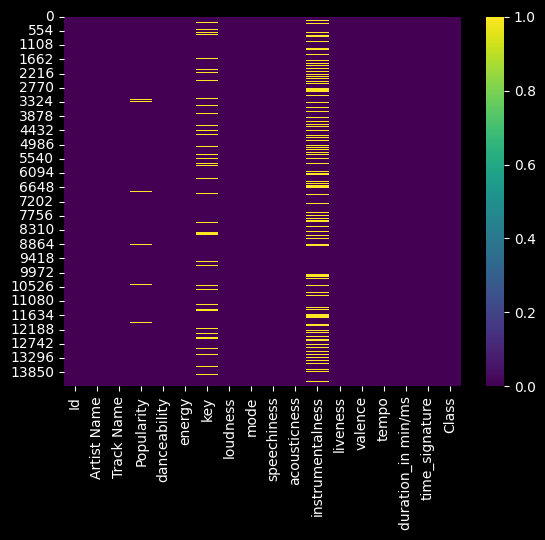

In [17]:
print(df.isnull().sum())


sns.heatmap(df.isnull(), cmap="viridis")
plt.show()

##  Data Visualization

### Numircal columns

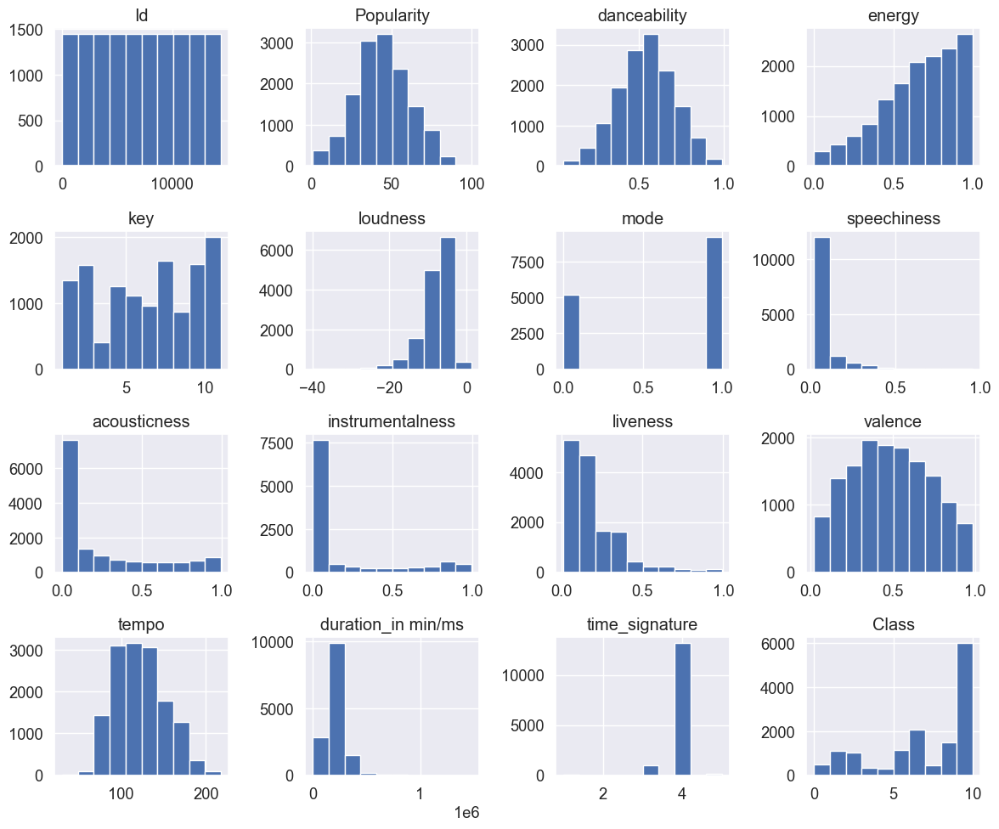

In [37]:
#The distribution
numerical_columns = df.select_dtypes(include=['float64', 'int64'])

numerical_columns.hist(figsize=(12, 10))
plt.tight_layout()
plt.show()


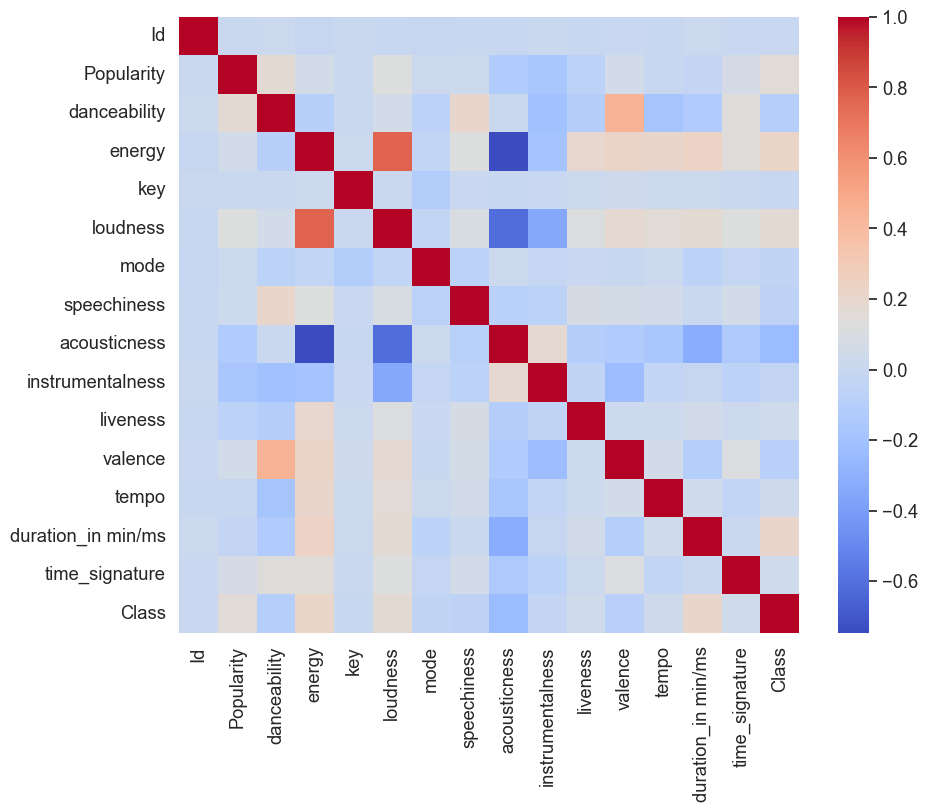

In [38]:
#Correlation
correlation_matrix = numerical_columns.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm')
plt.show()

In [44]:
sns.set(font_scale=1.2)
# Available styles: "darkgrid", "whitegrid", "dark", "white", "ticks"
selected_style = "darkgrid"
sns.set_style(selected_style)

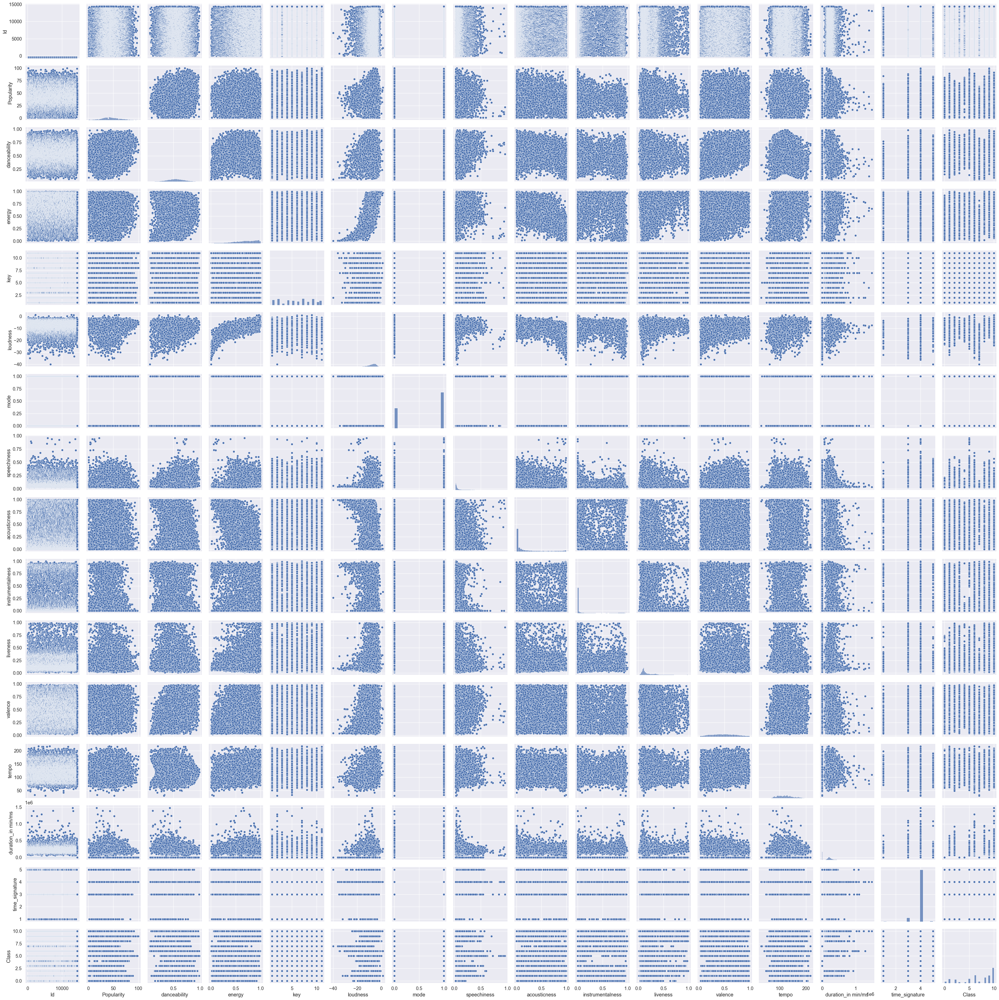

In [39]:
#Pair plot 
g = sns.pairplot(numerical_columns)

g.fig.suptitle(f"Pair Plot - {selected_style} style", y=1.02)
sns.pairplot(numerical_columns)
plt.title(f"Histograms - {selected_style} style")
plt.show()

### Lets check some features we have 

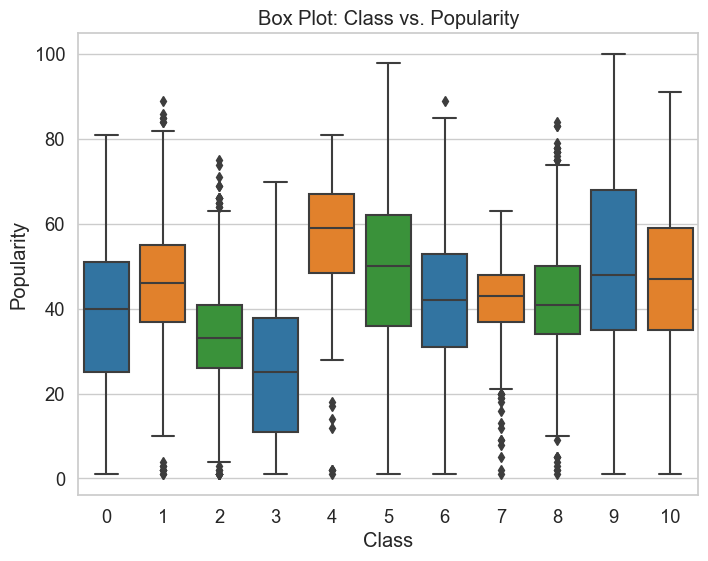

In [55]:
#Box plot

sns.set_style("whitegrid")

custom_palette = ["#1f77b4", "#ff7f0e", "#2ca02c"]

y_column = "Popularity"


plt.figure(figsize=(8, 6))
sns.boxplot(x="Class", y=y_column, data=df, palette=custom_palette)
plt.title(f"Box Plot: Class vs. {y_column}")
plt.xlabel("Class")
plt.ylabel(y_column)
plt.show()





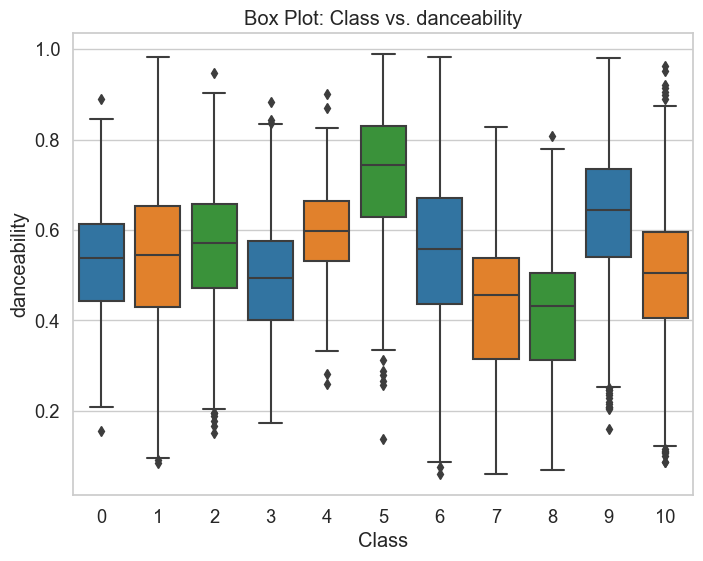

In [56]:
#Box plot

sns.set_style("whitegrid")

custom_palette = ["#1f77b4", "#ff7f0e", "#2ca02c"]

y_column = "danceability"

plt.figure(figsize=(8, 6))
sns.boxplot(x="Class", y=y_column, data=df, palette=custom_palette)
plt.title(f"Box Plot: Class vs. {y_column}")
plt.xlabel("Class")
plt.ylabel(y_column)
plt.show()





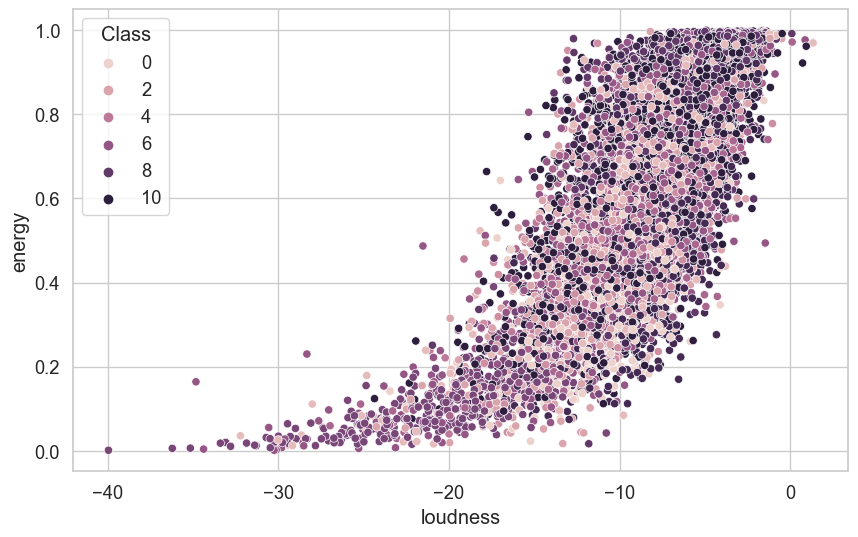

In [60]:
#Scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='loudness', y='energy',hue='Class', data=df)
plt.show()

### Categorical Visualization

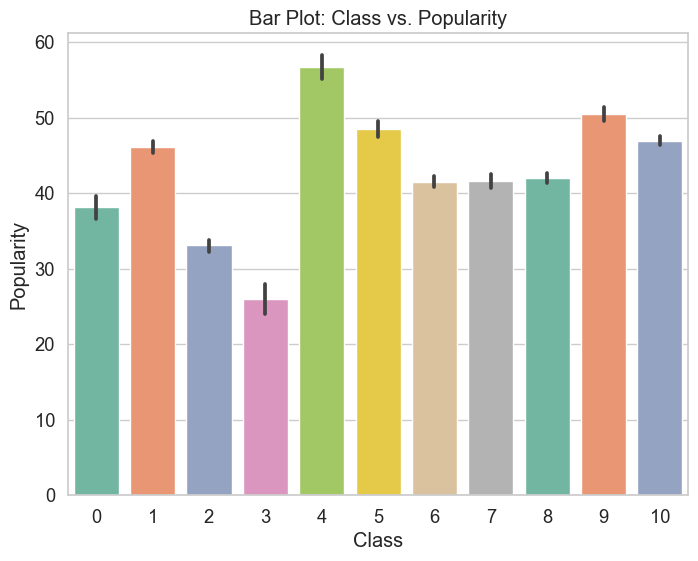

In [76]:
#BarPlot
plt.figure(figsize=(8, 6))
sns.barplot(x='Class', y='Popularity', data=df, palette="Set2")
plt.title("Bar Plot: Class vs. Popularity")
class_labels = df['Class'].unique().tolist()
sorted_label= class_labels.sort()
plt.xticks(ticks=range(len(class_labels)), labels=class_labels)
plt.show()

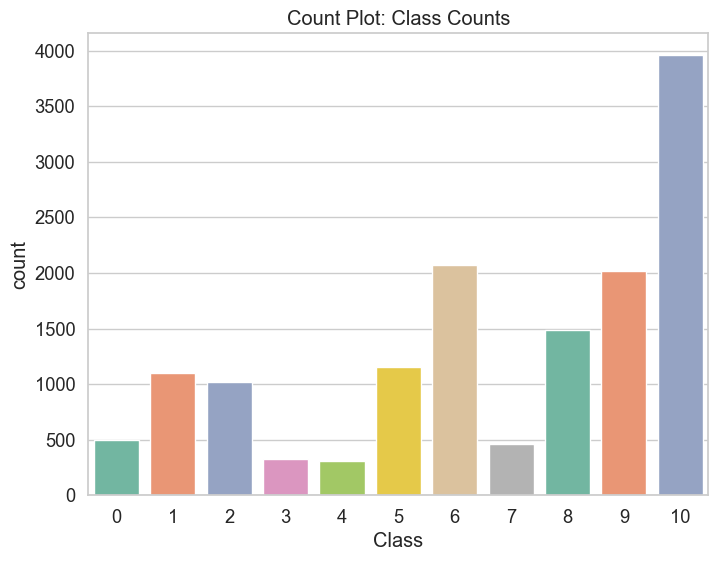

In [77]:
#Count plot
plt.figure(figsize=(8, 6))
sns.countplot(x='Class', data=df, palette="Set2")
plt.title("Count Plot: Class Counts")
plt.show()

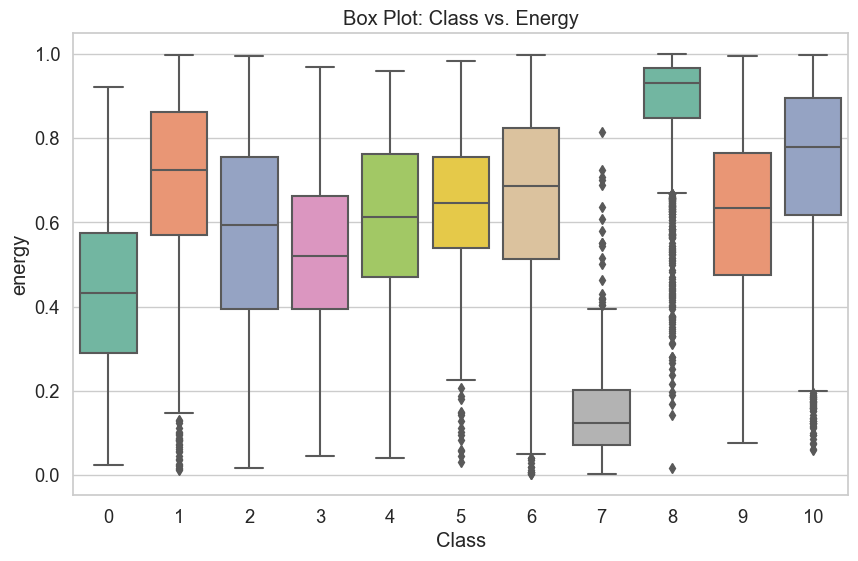

In [79]:
#Box plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='Class', y='energy', data=df, palette="Set2")
plt.title("Box Plot: Class vs. Energy")
plt.show()

## Data Preprocessing

### Handel missing values

In [80]:
median_popularity = df['Popularity'].median()
df['Popularity'].fillna(median_popularity, inplace=True)

In [81]:
mode_key = df['key'].mode()[0]
df['key'].fillna(mode_key, inplace=True)

In [82]:
df['instrumentalness'].fillna(0, inplace=True)

Id                    0
Artist Name           0
Track Name            0
Popularity            0
danceability          0
energy                0
key                   0
loudness              0
mode                  0
speechiness           0
acousticness          0
instrumentalness      0
liveness              0
valence               0
tempo                 0
duration_in min/ms    0
time_signature        0
Class                 0
dtype: int64


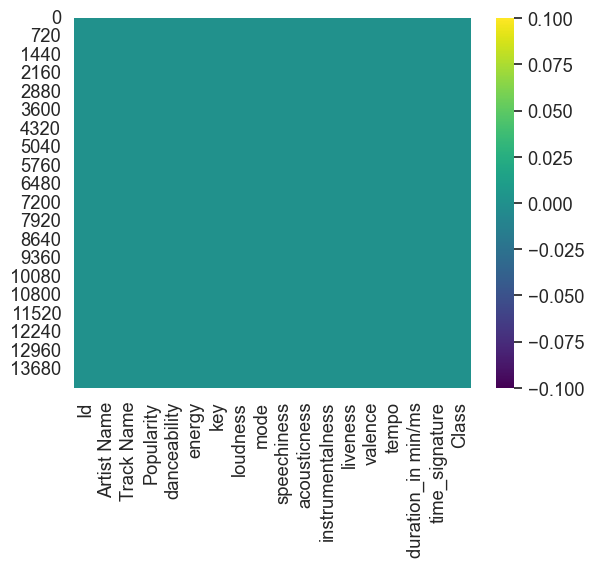

In [84]:
print(df.isnull().sum())


sns.heatmap(df.isnull(), cmap="viridis")
plt.show()

Then we have different  numerical features and thier values in different  scales , we should do some Normalization.

In [85]:
from sklearn.preprocessing import MinMaxScaler

In [86]:

columns_to_normalize = ['Popularity', 'danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_in min/ms']
scaler = MinMaxScaler()

df[columns_to_normalize] = scaler.fit_transform(df[columns_to_normalize])

### Encodig 

In [87]:
columns_to_one_hot = ['mode', 'time_signature']

df_encoded = pd.get_dummies(df, columns=columns_to_one_hot)

In [88]:
from sklearn.preprocessing import LabelEncoder

In [89]:
column_to_label_encode = 'Artist Name'

encoder = LabelEncoder()

df_encoded[column_to_label_encode] = encoder.fit_transform(df[column_to_label_encode])


## Feature Engineering

### Let's make some features and see if we can get useful set of features

In [90]:
df['beat_intensity'] = df['tempo'] * df['time_signature']

In [91]:
df['is_instrumental'] = df['instrumentalness'].apply(lambda x: 1 if x > 0.5 else 0)

In [92]:
df['energy_valence_interaction'] = df['energy'] * df['valence']

In [93]:
artist_popularity_avg = df.groupby('Artist Name')['Popularity'].mean()
df['artist_popularity_avg'] = df['Artist Name'].map(artist_popularity_avg)

Will see corrlation again to see if we get good feature

In [94]:
numerical_columns = df.select_dtypes(include=['float64', 'int64'])


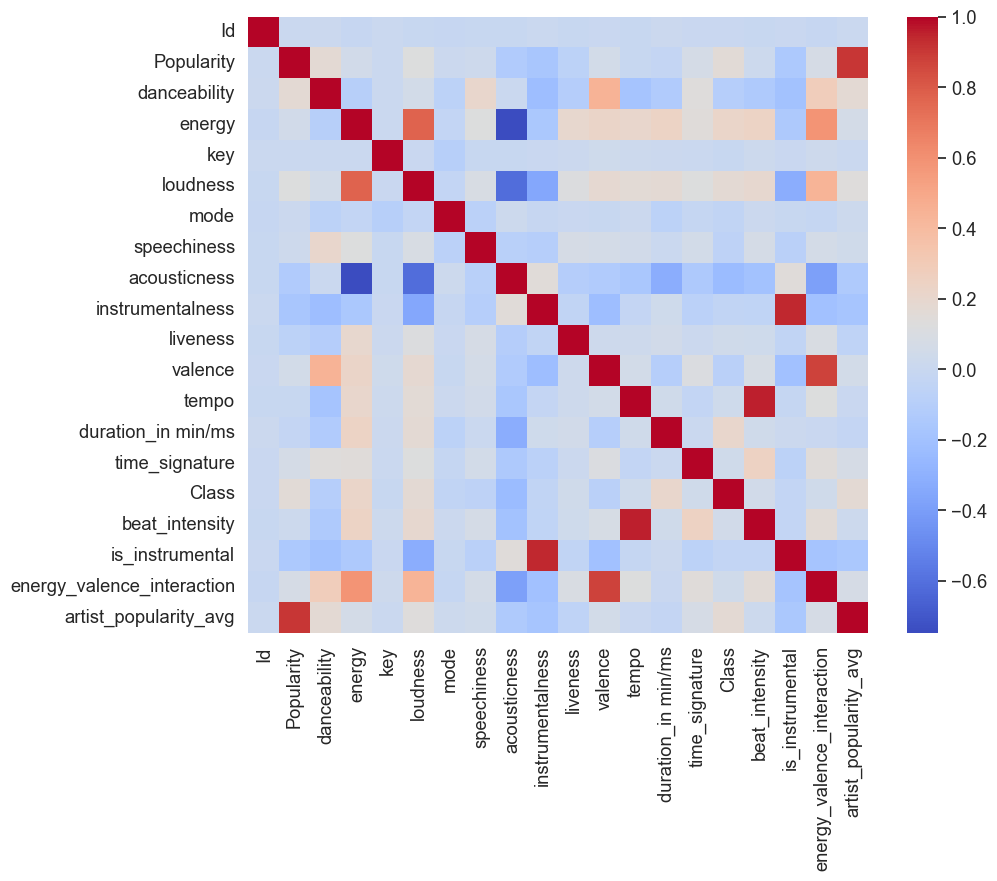

In [95]:
correlation_matrix = numerical_columns.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm')
plt.show()

So some feature give good corrlation and some not 

## Outliers 

Let's check if the column "loudness" has outliers using IQR

In [97]:

Q1 = df['loudness'].quantile(0.25)
Q3 = df['loudness'].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = df[(df['loudness'] < lower_bound) | (df['loudness'] > upper_bound)]

if outliers.empty:
    print("No outliers found in the 'loudness' column.")
else:
    print("Potential outliers in the 'loudness' column:")
    for index, row in outliers.iterrows():
        print(f"Index: {index}, Loudness: {row['loudness']}")

Potential outliers in the 'loudness' column:
Index: 34, Loudness: 0.5099288032159637
Index: 48, Loudness: 0.4852520947353126
Index: 73, Loudness: 0.20952196445004112
Index: 103, Loudness: 0.2238824042233738
Index: 105, Loudness: 0.5593306533636848
Index: 108, Loudness: 0.5666924976994236
Index: 110, Loudness: 0.5305855572238097
Index: 139, Loudness: 0.4408388627887828
Index: 167, Loudness: 0.5598149852278782
Index: 194, Loudness: 0.5704218530537124
Index: 255, Loudness: 0.5391824478132416
Index: 339, Loudness: 0.5520898919939943
Index: 345, Loudness: 0.5668135806654719
Index: 375, Loudness: 0.2074635540272194
Index: 388, Loudness: 0.2818084951808979
Index: 397, Loudness: 0.432459921538238
Index: 416, Loudness: 0.39264784230154504
Index: 491, Loudness: 0.55167820990943
Index: 521, Loudness: 0.4561921828837119
Index: 531, Loudness: 0.5356226086114206
Index: 584, Loudness: 0.5147479052646873
Index: 589, Loudness: 0.3043783600523079
Index: 630, Loudness: 0.5563035792124764
Index: 656, Loud

So we can see that the loudness has some outliers